To Do: Fix ensemble usage because right now it is using the optimization startpoint with vector tag (start_id, 0)

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import benchmark_models_petab

import os
import sys
sys.path.insert(1, os.path.join(sys.path[0], '..'))

from sym_model_importer import experiments
from utils import get_boehm_parameters

In [2]:
from pathlib import Path
step_2_dir = Path(".")

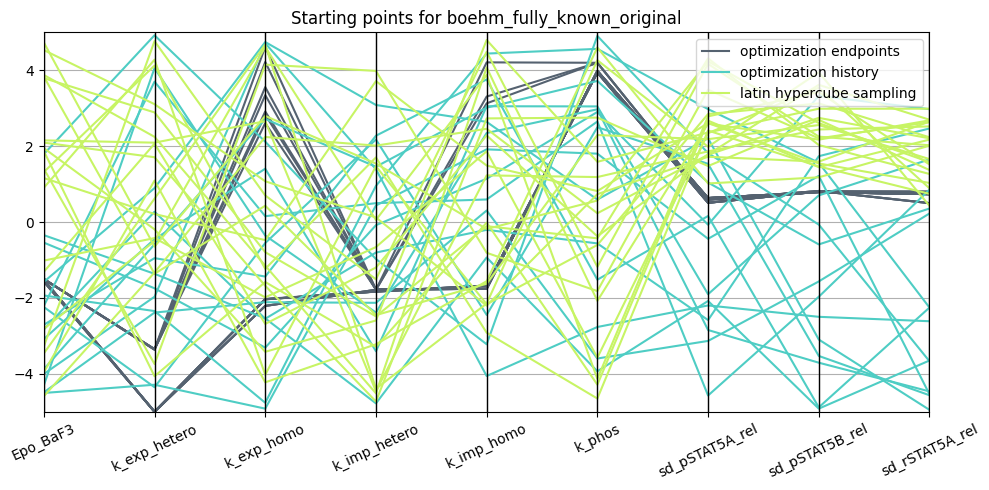

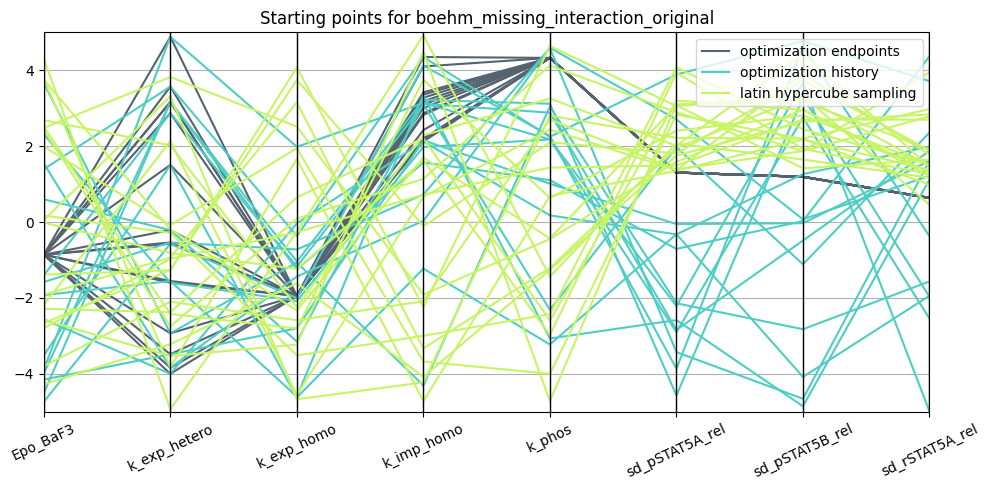

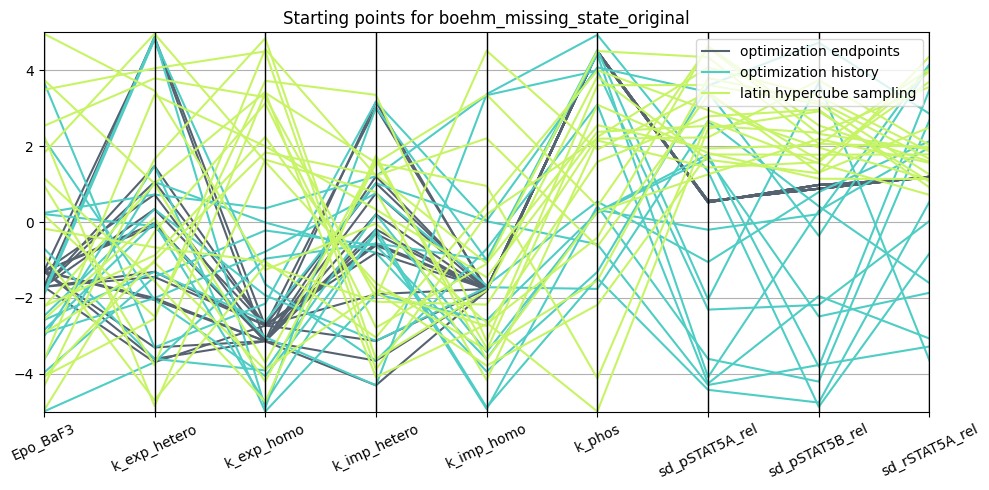

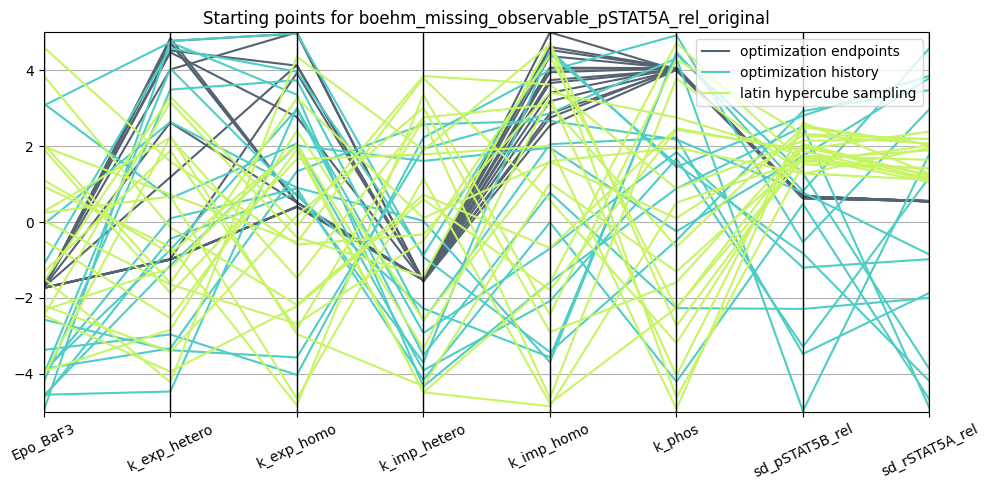

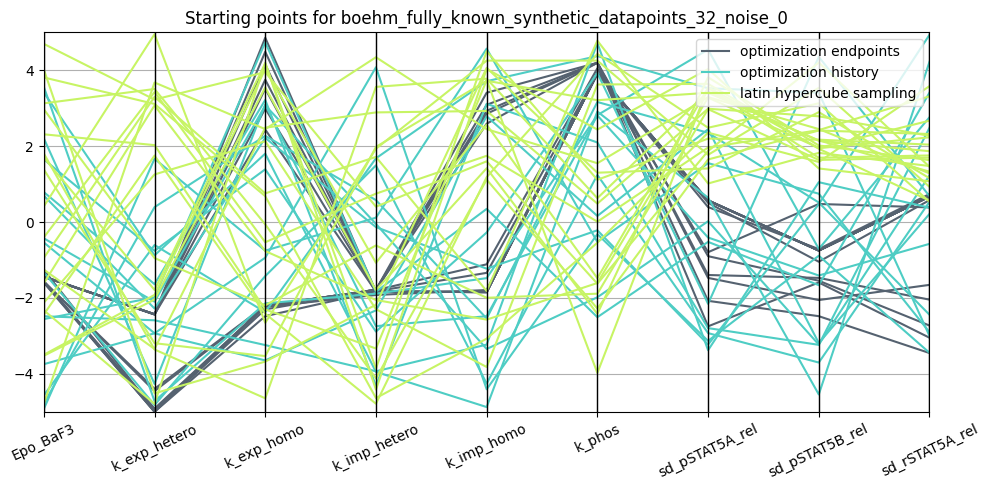

...

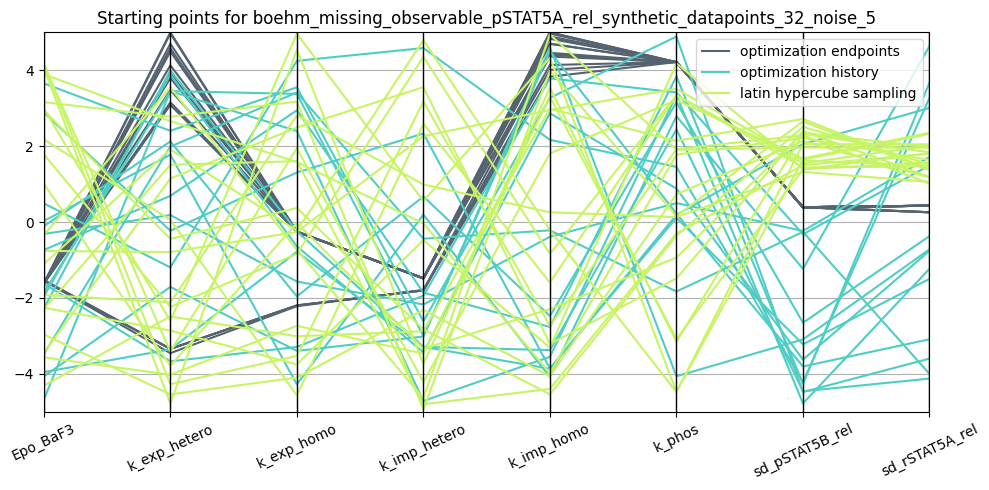

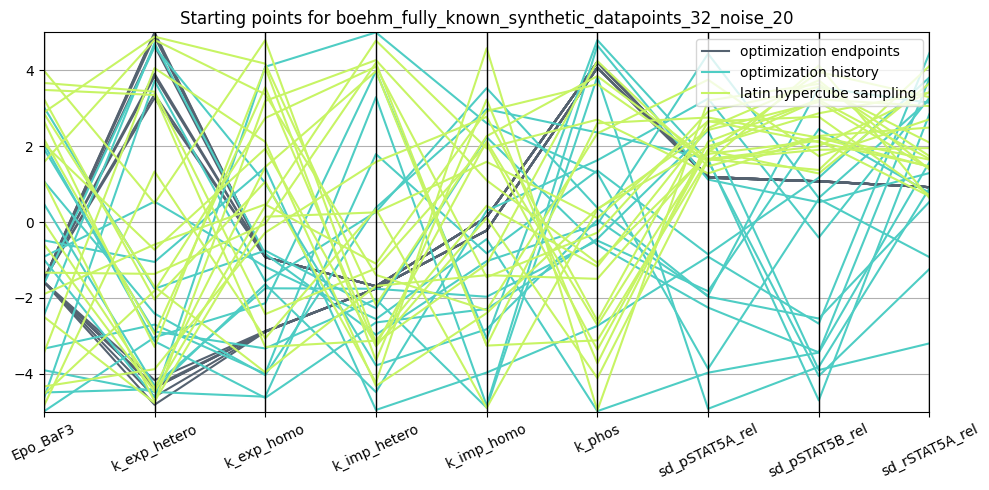

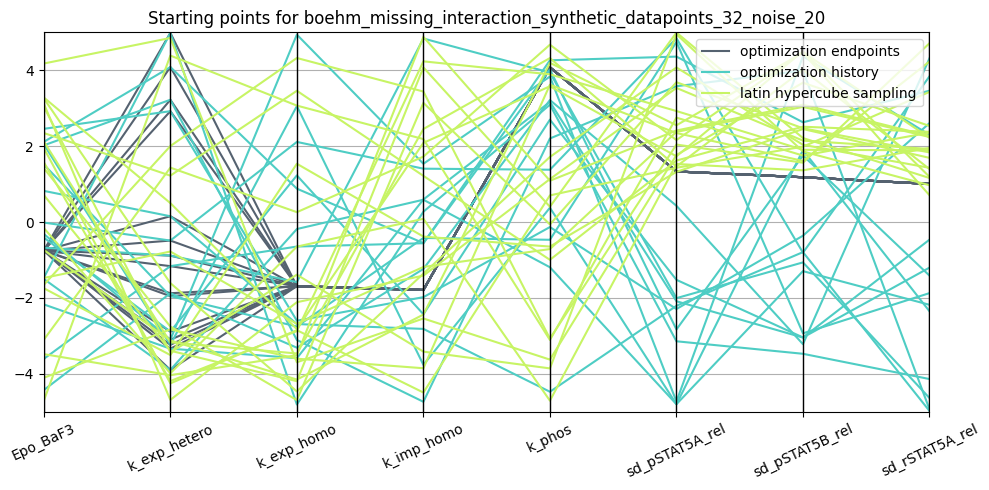

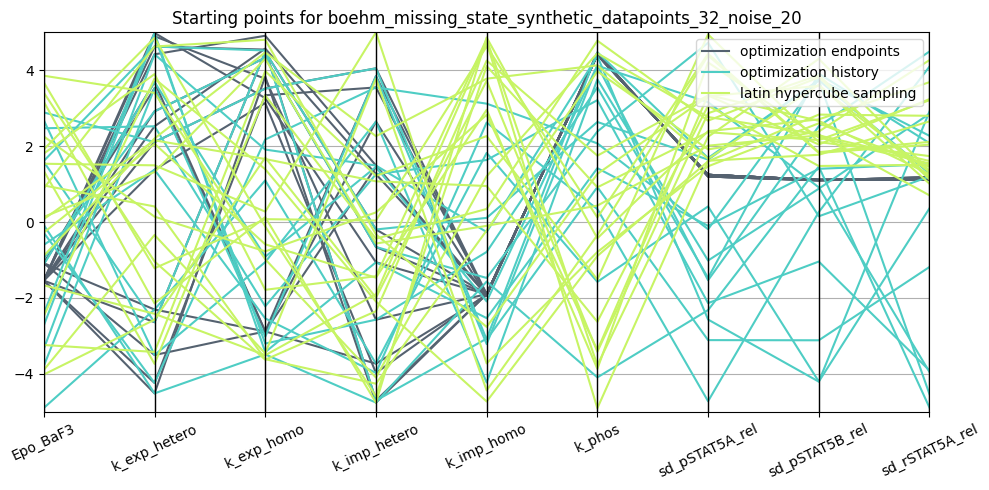

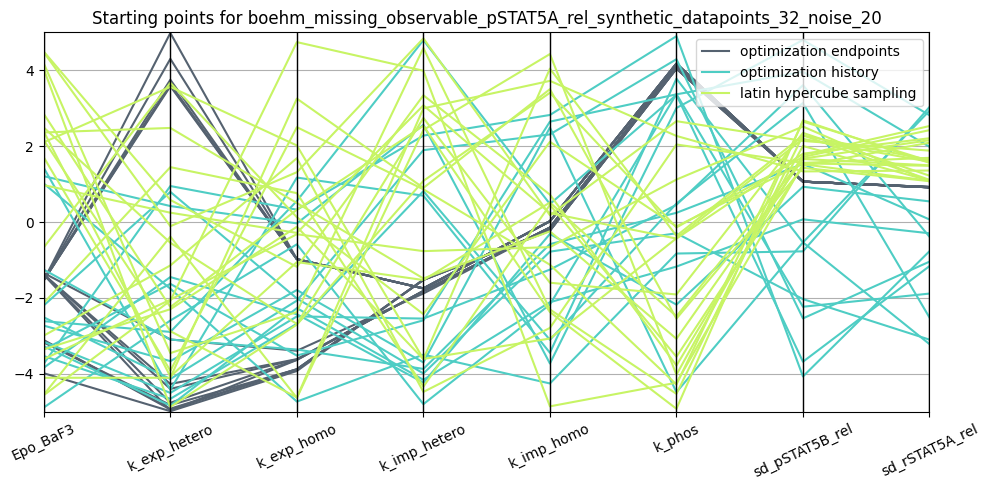

In [3]:
for experiment_id in experiments.keys():

    df_opt_end = pd.read_csv(
        step_2_dir / "optimization_endpoints" / experiment_id / "startpoints.csv"
    )
    df_opt_end["approach"] = "optimization endpoints"

    df_opt_hist = pd.read_csv(
        step_2_dir / "optimization_history" / experiment_id / "startpoints.csv"
    )
    df_opt_hist["approach"] = "optimization history"

    df_lhs = pd.read_csv(
        step_2_dir / "latin_hypercube_sampling" / experiment_id / "startpoints.csv"
    )
    df_lhs["approach"] = "latin hypercube sampling"

    df = pd.concat([df_opt_end, df_opt_hist, df_lhs])
    df.drop(columns=["vector_tag", "objective_function_value"], inplace=True)

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    pd.plotting.parallel_coordinates(
        df, "approach", ax=ax, color=('#556270', '#4ECDC4', '#C7F464')
    )
    ax.set_ylim(-5, 5)
    ax.set_title(f"Starting points for {experiment_id}")
    
    parameters = get_boehm_parameters(experiment_id)
    ax.set_xticklabels(["Epo_BaF3"] + parameters[1:], rotation = 25)
    
    fig.tight_layout()
    fig.show()

Compare starting points between different knowledge gaps

This visualization is not great yet.

In [4]:
import matplotlib.cm as cm
from utils import shiftedColorMap
from matplotlib.lines import Line2D

In [5]:
knowledge = ("fully_known", "missing_interaction", "missing_state", "missing_observable_pSTAT5A_rel")
cmaps = (cm.gray, cm.Blues_r, cm.Greens_r, cm.Purples_r)
colors = ("dimgrey", "royalblue", "mediumseagreen", "mediumvioletred")
colors_dict = {
    k: c for k, c in zip(knowledge, colors)
}
# reference
petab_problem = benchmark_models_petab.get_problem("Boehm_JProteomeRes2014")
ref = [petab_problem.x_nominal_scaled[i] for i in petab_problem.x_free_indices]
parameters_names = get_boehm_parameters("boehm_fully_known_original")

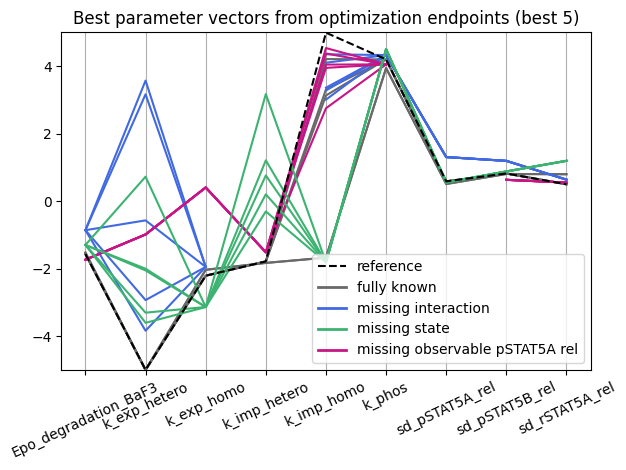

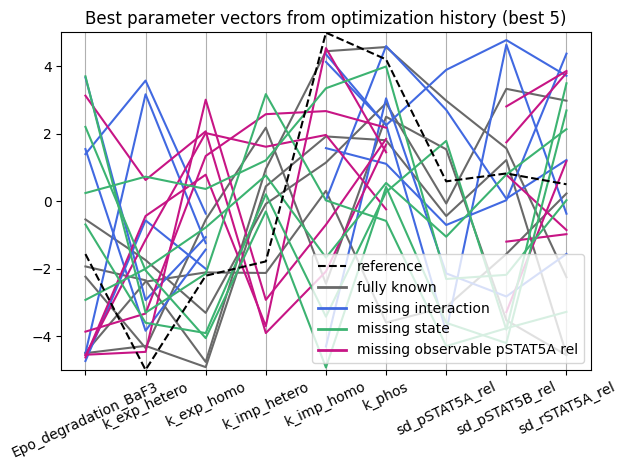

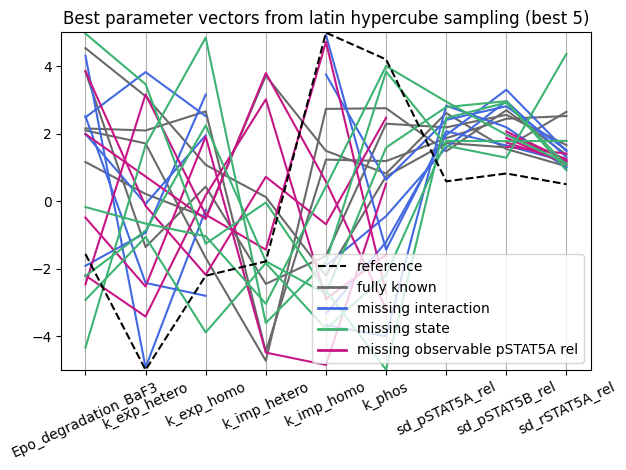

In [6]:
n_startpoints = 5
startpoint_methods = ("optimization_endpoints", "optimization_history", "latin_hypercube_sampling")

for startpoint_method in startpoint_methods:
    # load
    dfs = [
        pd.read_csv(
            step_2_dir / startpoint_method / model_sym_id / "startpoints.csv"
        )[:n_startpoints] for model_sym_id in list(experiments.keys())[:4] 
    ]
    for df, k in zip(dfs, knowledge):
        df["knowledge"] = k
    df_full = pd.concat(dfs)
    if "vector_tag" in df_full.columns:
        df_full.drop(columns=["vector_tag"], inplace=True)
    # plot
    fig, ax = plt.subplots(1, 1)
    for group, df in df_full.groupby(by="knowledge"):
        df[parameters_names].T.plot(ax=ax, rot=25, c=colors_dict[group])
    ax.plot(ref, "k--")
    ax.legend(
        handles=[Line2D([0], [0], color="k", linestyle="--", label="reference")] \
            + [Line2D([0], [0], color=color, lw=2, label=label.replace('_', ' ')) for color, label in zip(colors, knowledge)],
        # loc="lower right",
    )
    # ax.set_xticklabels(["Epo_BaF3"] + parameters_names[1:], rotation = 25)
    ax.set_ylim(-5, 5)
    ax.grid(which="major", axis="x", linestyle="-")
    ax.set_title(f"Best parameter vectors from {startpoint_method.replace('_', ' ')} (best {n_startpoints})")
    fig.tight_layout()
    fig.savefig(step_2_dir / startpoint_method / "startpoints_in_comparison.png")